## Understanding Bussiness Case & Doing Domain Analysis

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import stat

### Basic Checks

In [4]:
pd.set_option('display.max_columns',None)

In [5]:
df=pd.read_csv('Iabac_project.csv')
df

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,OverTime,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
0,E1001000,32,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,10,3,4,55,3,2,4,1,No,12,4,10,2,2,10,7,0,8,No,3
1,E1001006,47,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,14,4,4,42,3,2,1,2,No,12,4,20,2,3,7,7,1,7,No,3
2,E1001007,40,Male,Life Sciences,Married,Sales,Sales Executive,Travel_Frequently,5,4,4,48,2,3,1,5,Yes,21,3,20,2,3,18,13,1,12,No,4
3,E1001009,41,Male,Human Resources,Divorced,Human Resources,Manager,Travel_Rarely,10,4,2,73,2,5,4,3,No,15,2,23,2,2,21,6,12,6,No,3
4,E1001010,60,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,16,4,1,84,3,2,1,8,No,14,4,10,1,3,2,2,2,2,No,3
5,E1001011,27,Male,Life Sciences,Divorced,Development,Developer,Travel_Frequently,10,2,4,32,3,3,1,1,No,21,3,9,4,2,9,7,1,7,No,4
6,E1001016,50,Male,Marketing,Married,Sales,Sales Representative,Travel_Rarely,8,4,4,54,3,1,2,7,No,15,4,4,2,3,2,2,2,2,No,3
7,E1001019,28,Female,Life Sciences,Single,Development,Developer,Travel_Rarely,1,2,1,67,1,1,2,7,Yes,13,4,10,4,3,7,7,3,7,Yes,3
8,E1001020,36,Female,Life Sciences,Married,Development,Developer,Non-Travel,8,3,1,63,4,3,1,9,No,14,1,10,2,3,8,7,0,5,No,3
9,E1001021,38,Female,Life Sciences,Single,Development,Developer,Travel_Rarely,1,3,3,81,3,3,3,4,Yes,14,4,10,4,4,1,0,0,0,No,3


In [139]:
pd.set_option('display.max_rows',None)

In [140]:
df

,EmpNumber,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,...,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
0,E1001000,32,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,10,3,...,4,10,2,2,10,7,0,8,No,3
1,E1001006,47,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,14,4,...,4,20,2,3,7,7,1,7,No,3
2,E1001007,40,Male,Life Sciences,Married,Sales,Sales Executive,Travel_Frequently,5,4,...,3,20,2,3,18,13,1,12,No,4
3,E1001009,41,Male,Human Resources,Divorced,Human Resources,Manager,Travel_Rarely,10,4,...,2,23,2,2,21,6,12,6,No,3
4,E1001010,60,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,16,4,...,4,10,1,3,2,2,2,2,No,3
5,E1001011,27,Male,Life Sciences,Divorced,Development,Developer,Travel_Frequently,10,2,...,3,9,4,2,9,7,1,7,No,4
6,E1001016,50,Male,Marketing,Married,Sales,Sales Representative,Travel_Rarely,8,4,...,4,4,2,3,2,2,2,2,No,3
7,E1001019,28,Female,Life Sciences,Single,Development,Developer,Travel_Rarely,1,2,...,4,10,4,3,7,7,3,7,Yes,3
8,E1001020,36,Female,Life Sciences,Married,Development,Developer,Non-Travel,8,3,...,1,10,2,3,8,7,0,5,No,3
9,E1001021,38,Female,Life Sciences,Single,Development,Developer,Travel_Rarely,1,3,...,4,10,4,4,1,0,0,0,No,3


In [141]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1200 entries, 0 to 1199
Data columns (total 28 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   EmpNumber                     1200 non-null   object
 1   Age                           1200 non-null   int64 
 2   Gender                        1200 non-null   object
 3   EducationBackground           1200 non-null   object
 4   MaritalStatus                 1200 non-null   object
 5   EmpDepartment                 1200 non-null   object
 6   EmpJobRole                    1200 non-null   object
 7   BusinessTravelFrequency       1200 non-null   object
 8   DistanceFromHome              1200 non-null   int64 
 9   EmpEducationLevel             1200 non-null   int64 
 10  EmpEnvironmentSatisfaction    1200 non-null   int64 
 11  EmpHourlyRate                 1200 non-null   int64 
 12  EmpJobInvolvement             1200 non-null   int64 
 13  EmpJobLevel       

In [142]:
df.describe() #gives numrical columns stastical information

,Age,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,PerformanceRating
count,1200.000000,1200.000000,1200.00000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000,1200.000000
mean,36.918333,9.165833,2.89250,2.715833,65.981667,2.731667,2.067500,2.732500,2.665000,15.222500,2.725000,11.330000,2.785833,2.744167,7.077500,4.291667,2.194167,4.105000,2.948333
std,9.087289,8.176636,1.04412,1.090599,20.211302,0.707164,1.107836,1.100888,2.469384,3.625918,1.075642,7.797228,1.263446,0.699374,6.236899,3.613744,3.221560,3.541576,0.518866
min,18.000000,1.000000,1.00000,1.000000,30.000000,1.000000,1.000000,1.000000,0.000000,11.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,2.000000
25%,30.000000,2.000000,2.00000,2.000000,48.000000,2.000000,1.000000,2.000000,1.000000,12.000000,2.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000,3.000000
50%,36.000000,7.000000,3.00000,3.000000,66.000000,3.000000,2.000000,3.000000,2.000000,14.000000,3.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000,3.000000
75%,43.000000,14.000000,4.00000,4.000000,83.000000,3.000000,3.000000,4.000000,4.000000,18.000000,4.000000,15.000000,3.000000,3.000000,10.000000,7.000000,3.000000,7.000000,3.000000
max,60.000000,29.000000,5.00000,4.000000,100.000000,4.000000,5.000000,4.000000,9.000000,25.000000,4.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000,4.000000


In [143]:
df.describe(include='O') #gives categorical columns stastical information

,EmpNumber,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,OverTime,Attrition
count,1200,1200,1200,1200,1200,1200,1200,1200,1200
unique,1200,2,6,3,6,19,3,2,2
top,E1001000,Male,Life Sciences,Married,Sales,Sales Executive,Travel_Rarely,No,No
freq,1,725,492,548,373,270,846,847,1022


In [144]:
df.drop('EmpNumber',axis=1,inplace=True)

In [145]:
df.PerformanceRating.unique()

array([3, 4, 2], dtype=int64)

## EDA

In [146]:

cont_df=[]
cat_df=[]
def data(df):
    for i in df:
        if(df[i].dtype=='int64'): 
            cont_df.append(i)
        else:
            cat_df.append(i)

In [147]:
data(df) # called function

#### function gives Numrical values and categorical values in two different lists 

In [148]:
cont_df

['Age',
 'DistanceFromHome',
 'EmpEducationLevel',
 'EmpEnvironmentSatisfaction',
 'EmpHourlyRate',
 'EmpJobInvolvement',
 'EmpJobLevel',
 'EmpJobSatisfaction',
 'NumCompaniesWorked',
 'EmpLastSalaryHikePercent',
 'EmpRelationshipSatisfaction',
 'TotalWorkExperienceInYears',
 'TrainingTimesLastYear',
 'EmpWorkLifeBalance',
 'ExperienceYearsAtThisCompany',
 'ExperienceYearsInCurrentRole',
 'YearsSinceLastPromotion',
 'YearsWithCurrManager',
 'PerformanceRating']

In [149]:
cat_df

['Gender',
 'EducationBackground',
 'MaritalStatus',
 'EmpDepartment',
 'EmpJobRole',
 'BusinessTravelFrequency',
 'OverTime',
 'Attrition']

In [150]:
type(cont_df)

list

### Univariate analysis

In [151]:
cont_df=df[cont_df]
cont_df

,Age,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,EmpHourlyRate,EmpJobInvolvement,EmpJobLevel,EmpJobSatisfaction,NumCompaniesWorked,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,PerformanceRating
0,32,10,3,4,55,3,2,4,1,12,4,10,2,2,10,7,0,8,3
1,47,14,4,4,42,3,2,1,2,12,4,20,2,3,7,7,1,7,3
2,40,5,4,4,48,2,3,1,5,21,3,20,2,3,18,13,1,12,4
3,41,10,4,2,73,2,5,4,3,15,2,23,2,2,21,6,12,6,3
4,60,16,4,1,84,3,2,1,8,14,4,10,1,3,2,2,2,2,3
5,27,10,2,4,32,3,3,1,1,21,3,9,4,2,9,7,1,7,4
6,50,8,4,4,54,3,1,2,7,15,4,4,2,3,2,2,2,2,3
7,28,1,2,1,67,1,1,2,7,13,4,10,4,3,7,7,3,7,3
8,36,8,3,1,63,4,3,1,9,14,1,10,2,3,8,7,0,5,3
9,38,1,3,3,81,3,3,3,4,14,4,10,4,4,1,0,0,0,3


### Numrical Data 

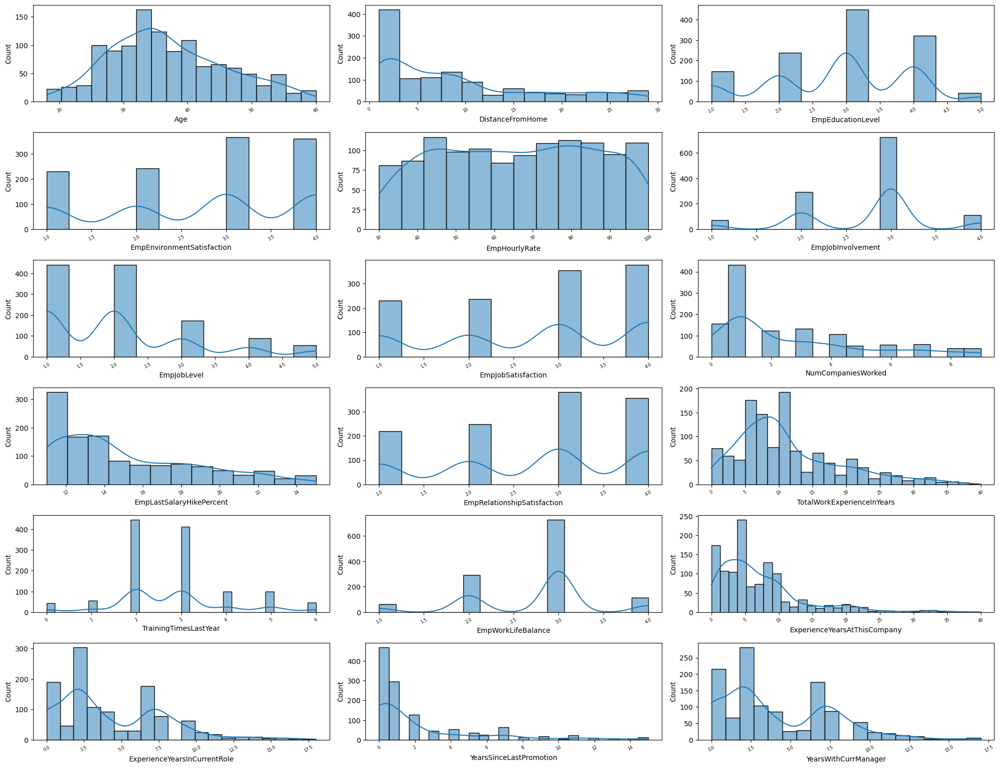

In [152]:
cont_df.drop('PerformanceRating',axis=1,inplace=True)
plt.figure(figsize=(20, 20)) 
plotnumber = 1 

for i in cont_df: 
    plt.subplot(8, 3, plotnumber)  
    sns.histplot(x=cont_df[i], kde=True)  
    plt.xticks(rotation=30, size=6) 
    plotnumber += 1 

plt.tight_layout() 
plt.show() 


In [153]:
cat_df=df[cat_df]
cat_df

,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,OverTime,Attrition
0,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,No,No
1,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,No,No
2,Male,Life Sciences,Married,Sales,Sales Executive,Travel_Frequently,Yes,No
3,Male,Human Resources,Divorced,Human Resources,Manager,Travel_Rarely,No,No
4,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,No,No
5,Male,Life Sciences,Divorced,Development,Developer,Travel_Frequently,No,No
6,Male,Marketing,Married,Sales,Sales Representative,Travel_Rarely,No,No
7,Female,Life Sciences,Single,Development,Developer,Travel_Rarely,Yes,Yes
8,Female,Life Sciences,Married,Development,Developer,Non-Travel,No,No
9,Female,Life Sciences,Single,Development,Developer,Travel_Rarely,Yes,No


### Categorical Data

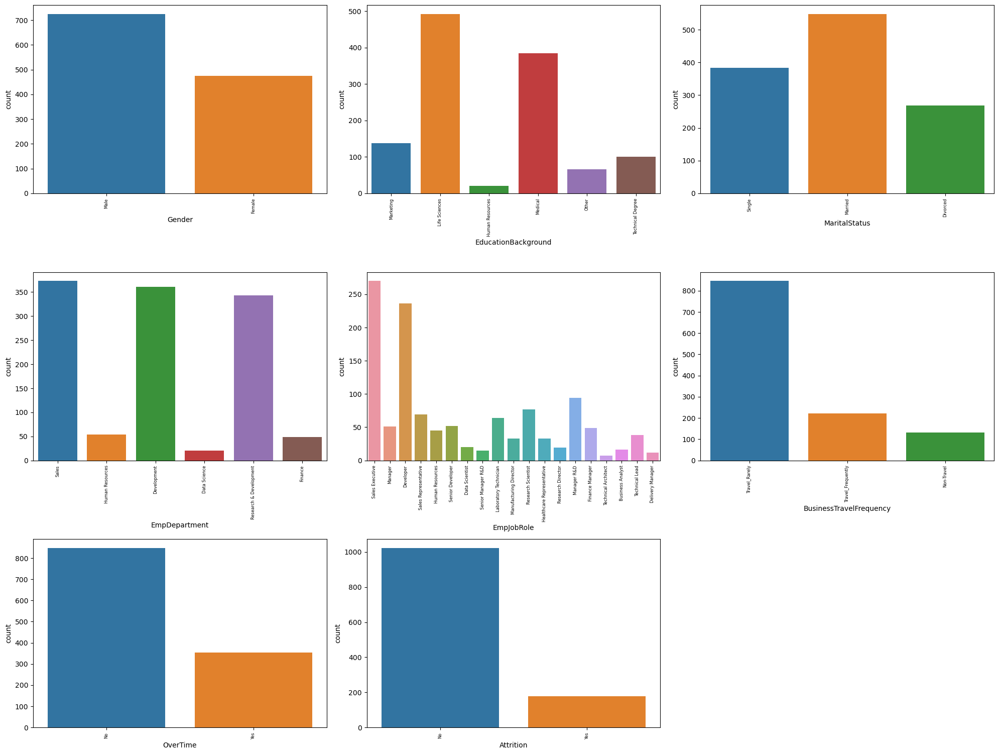

In [154]:

plt.figure(figsize=(20, 20)) 
plotnumber = 1  
for i in cat_df: 
    plt.subplot(4, 3, plotnumber) 
    sns.countplot(x=cat_df[i])  
    plt.xticks(rotation=90, size=6) 
    plotnumber += 1
plt.tight_layout() 
plt.show() 


### Bivariate Analysis

### Numrical values

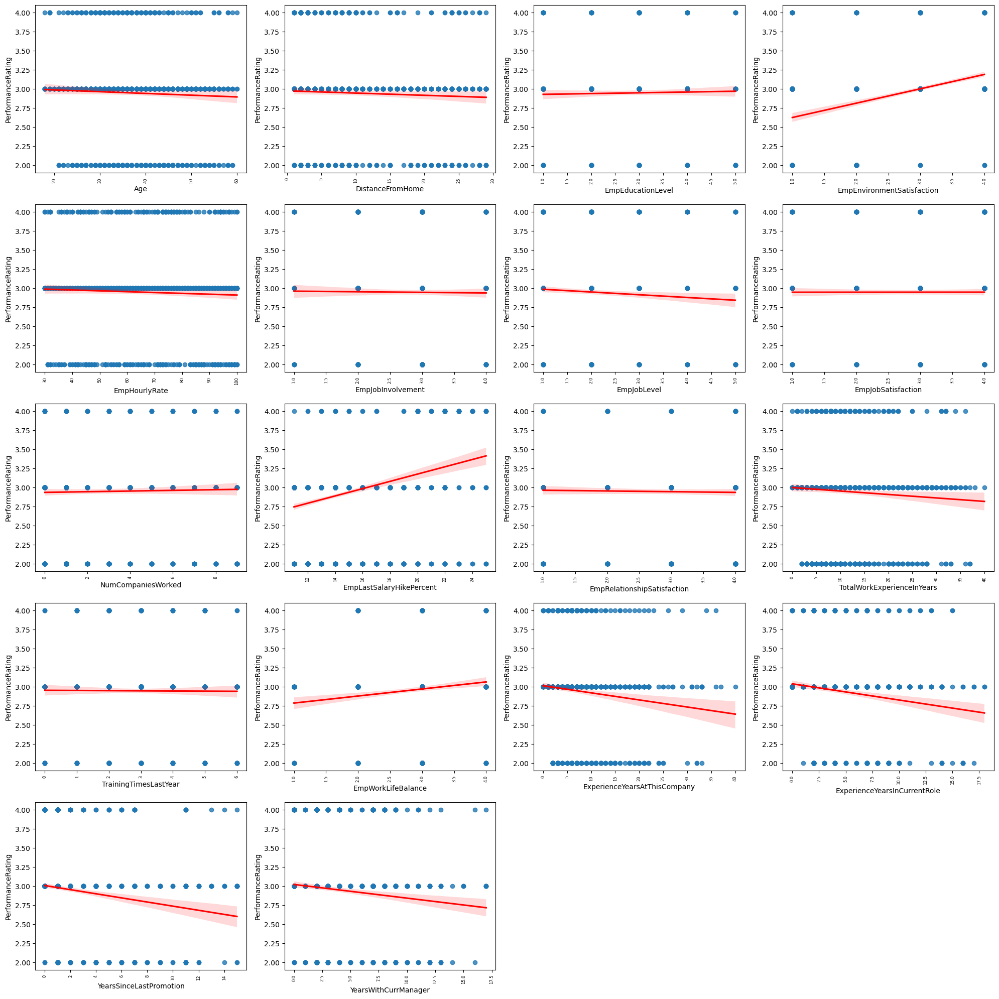

In [155]:
plt.figure(figsize=(20,20))
plotnumber=1
for i in cont_df:
    plt.subplot(5,4,plotnumber)
    sns.regplot(x=cont_df[i],y=df.PerformanceRating,line_kws={'color': 'red'})
    plt.xticks(rotation=90,size=6)
    plotnumber=plotnumber+1
plt.tight_layout()
plt.show()
    

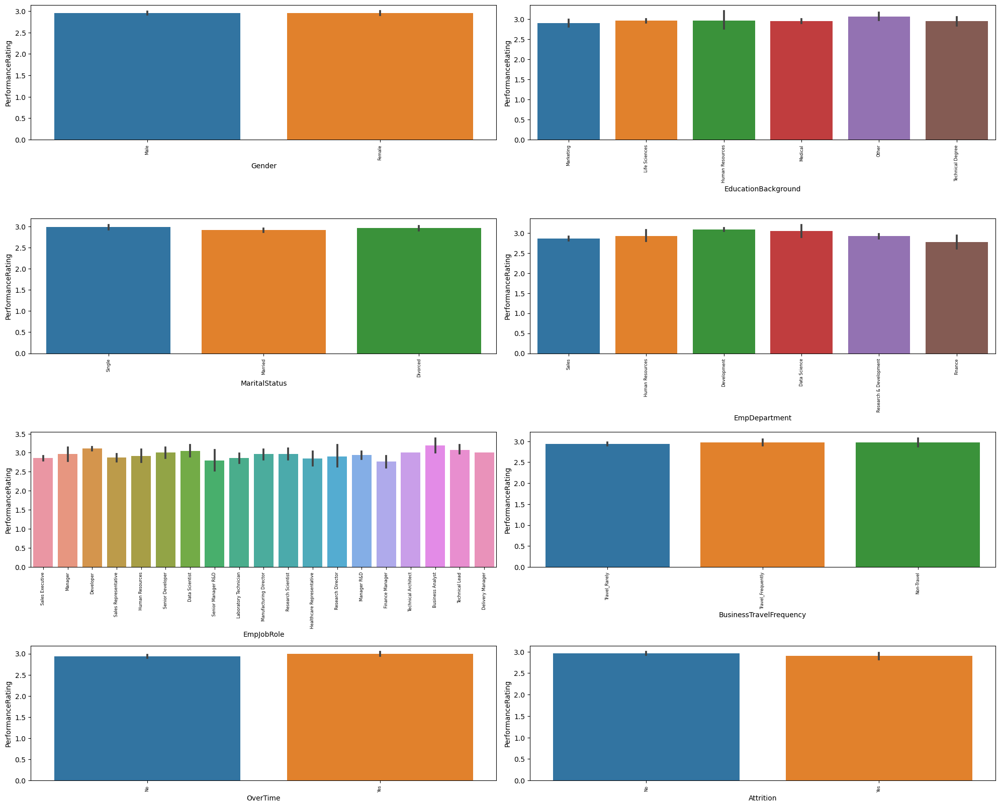

In [156]:
plt.figure(figsize=(20,20))
plotnumber=1
for i in cat_df:
    plt.subplot(5,2,plotnumber)
    sns.barplot(x=cat_df[i],y=df.PerformanceRating)
    plt.xticks(rotation=90,size=6)
    plotnumber=plotnumber+1
plt.tight_layout()
plt.show()
    

### Data Pre-Processing

### Handling with null values and Corrupted Data

In [157]:
df.isnull().sum()  # checking where dataset have outliers or not  corrupted  i m go with standard devitaion of all features if any feature has value equal zero then data have corrupted values.

Age                             0
Gender                          0
EducationBackground             0
MaritalStatus                   0
EmpDepartment                   0
EmpJobRole                      0
BusinessTravelFrequency         0
DistanceFromHome                0
EmpEducationLevel               0
EmpEnvironmentSatisfaction      0
EmpHourlyRate                   0
EmpJobInvolvement               0
EmpJobLevel                     0
EmpJobSatisfaction              0
NumCompaniesWorked              0
OverTime                        0
EmpLastSalaryHikePercent        0
EmpRelationshipSatisfaction     0
TotalWorkExperienceInYears      0
TrainingTimesLastYear           0
EmpWorkLifeBalance              0
ExperienceYearsAtThisCompany    0
ExperienceYearsInCurrentRole    0
YearsSinceLastPromotion         0
YearsWithCurrManager            0
Attrition                       0
PerformanceRating               0
dtype: int64

#### corrupted  i m go with standard devitaion of all features if any feature has value equal zero then data have corrupted values.

### Handling with Outliers

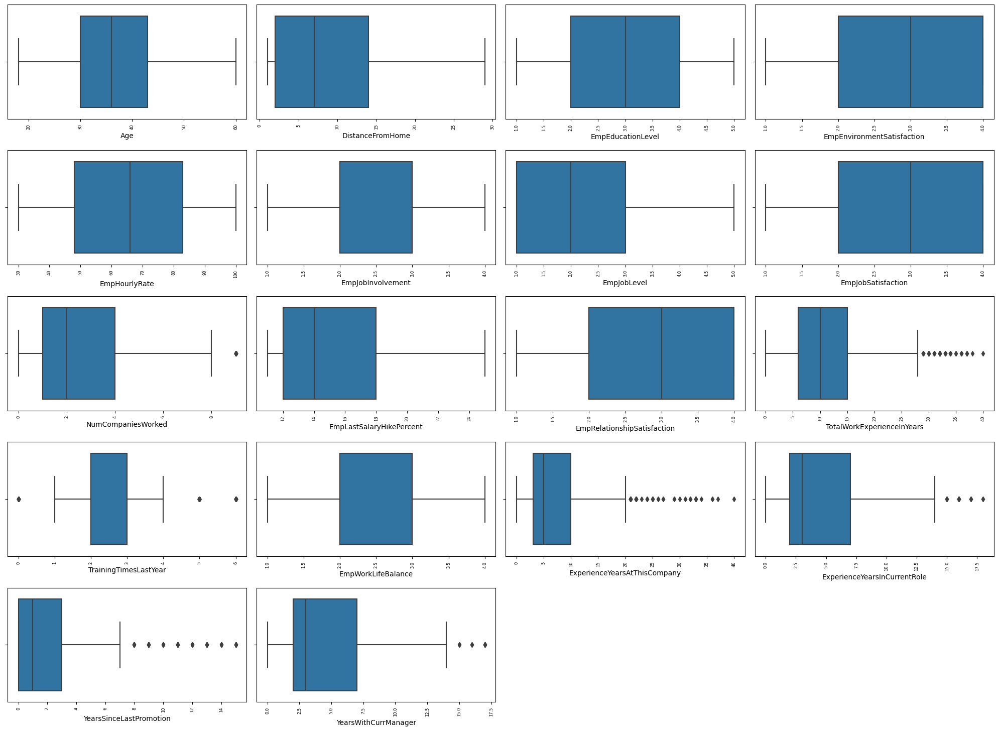

In [158]:
plt.figure(figsize=(20,20))
plotnumber=1
for i in cont_df:
    plt.subplot(7,4,plotnumber)
    sns.boxplot(x=cont_df[i])
    plt.xticks(rotation=90,size=6)
    plotnumber=plotnumber+1
plt.tight_layout()
plt.show()

In [159]:
def outliers(df,cont_df):
    for i in cont_df:
        if(i in df):
            for j in df:
                if(j==i):
               
                    q3=cont_df[j].quantile(0.75) # quarter third value
                    q1=cont_df[j].quantile(0.25) #quarter first value
                    IQR=q3-q1
                    
                    max_limit=q3+1.5*IQR # finding max_limit
                    min_limit=q1-IQR*1.5 # finding min_limit

                
                    df.loc[df[j]>max_limit,j]=cont_df[i].median() # replacing outliers with median 
                    df.loc[df[j]<min_limit,j]=cont_df[i].median()
                   
    return 'succesful'

In [160]:
outliers(df,cont_df)

'succesful'

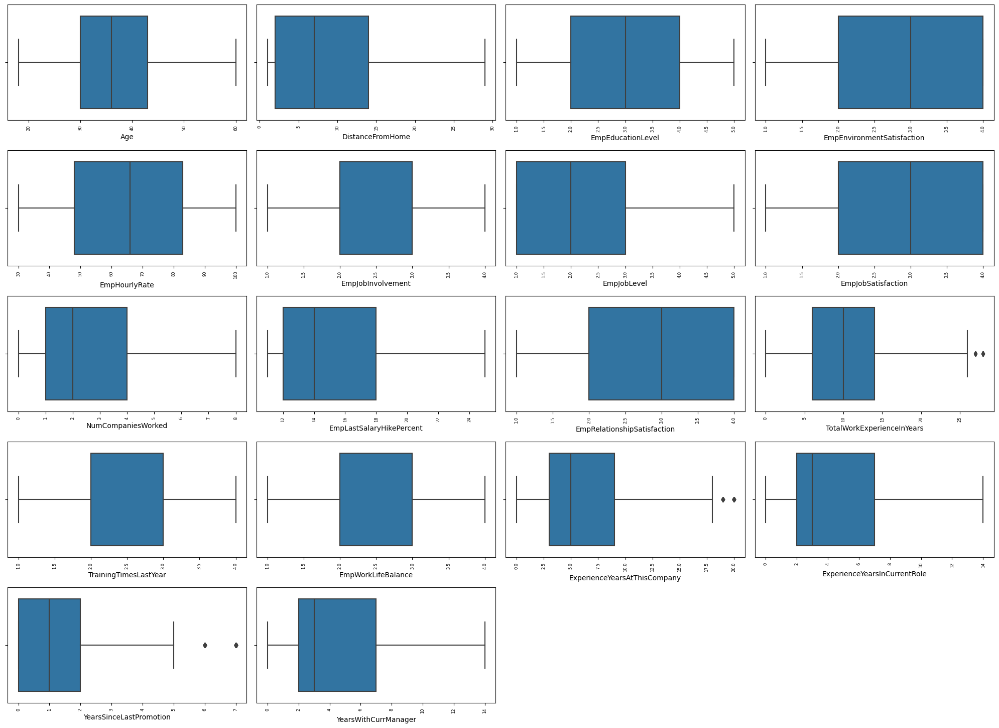

In [161]:
plt.figure(figsize=(20,20))
plotnumber=1
for i in cont_df:
    
    plt.subplot(7,4,plotnumber)
    sns.boxplot(x=df[i])
    plt.xticks(rotation=90,size=6)
    plotnumber=plotnumber+1
plt.tight_layout()
plt.show()

### Conversion of Categorical values into Numrical values

In [162]:
 from sklearn.preprocessing import OrdinalEncoder 

In [163]:

oe=OrdinalEncoder()
for i in df:
    if(i in cat_df):
        df[i]=oe.fit_transform(df[[i]])


In [164]:
df

,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,...,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
0,32,1.0,2.0,2.0,5.0,13.0,2.0,10,3,4,...,4,10,2,2,10,7,0,8,0.0,3
1,47,1.0,2.0,2.0,5.0,13.0,2.0,14,4,4,...,4,20,2,3,7,7,1,7,0.0,3
2,40,1.0,1.0,1.0,5.0,13.0,1.0,5,4,4,...,3,20,2,3,18,13,1,12,0.0,4
3,41,1.0,0.0,0.0,3.0,8.0,2.0,10,4,2,...,2,23,2,2,5,6,1,6,0.0,3
4,60,1.0,2.0,2.0,5.0,13.0,2.0,16,4,1,...,4,10,1,3,2,2,2,2,0.0,3
5,27,1.0,1.0,0.0,1.0,3.0,1.0,10,2,4,...,3,9,4,2,9,7,1,7,0.0,4
6,50,1.0,2.0,1.0,5.0,14.0,2.0,8,4,4,...,4,4,2,3,2,2,2,2,0.0,3
7,28,0.0,1.0,2.0,1.0,3.0,2.0,1,2,1,...,4,10,4,3,7,7,3,7,1.0,3
8,36,0.0,1.0,1.0,1.0,3.0,0.0,8,3,1,...,1,10,2,3,8,7,0,5,0.0,3
9,38,0.0,1.0,2.0,1.0,3.0,2.0,1,3,3,...,4,10,4,4,1,0,0,0,0.0,3


### Scaling

in problem features values are ranging closely to each other so we dont need to Scaling

### Balncing
we will do after train test split 

### Feature Selection

#### Drop Redaduent columns

In [165]:
df

,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,...,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
0,32,1.0,2.0,2.0,5.0,13.0,2.0,10,3,4,...,4,10,2,2,10,7,0,8,0.0,3
1,47,1.0,2.0,2.0,5.0,13.0,2.0,14,4,4,...,4,20,2,3,7,7,1,7,0.0,3
2,40,1.0,1.0,1.0,5.0,13.0,1.0,5,4,4,...,3,20,2,3,18,13,1,12,0.0,4
3,41,1.0,0.0,0.0,3.0,8.0,2.0,10,4,2,...,2,23,2,2,5,6,1,6,0.0,3
4,60,1.0,2.0,2.0,5.0,13.0,2.0,16,4,1,...,4,10,1,3,2,2,2,2,0.0,3
5,27,1.0,1.0,0.0,1.0,3.0,1.0,10,2,4,...,3,9,4,2,9,7,1,7,0.0,4
6,50,1.0,2.0,1.0,5.0,14.0,2.0,8,4,4,...,4,4,2,3,2,2,2,2,0.0,3
7,28,0.0,1.0,2.0,1.0,3.0,2.0,1,2,1,...,4,10,4,3,7,7,3,7,1.0,3
8,36,0.0,1.0,1.0,1.0,3.0,0.0,8,3,1,...,1,10,2,3,8,7,0,5,0.0,3
9,38,0.0,1.0,2.0,1.0,3.0,2.0,1,3,3,...,4,10,4,4,1,0,0,0,0.0,3


### Feature Selection

### Drop Rededunt columns

#### there is no Rededunt columns found

### Finding corrlation between Features

<Axes: >

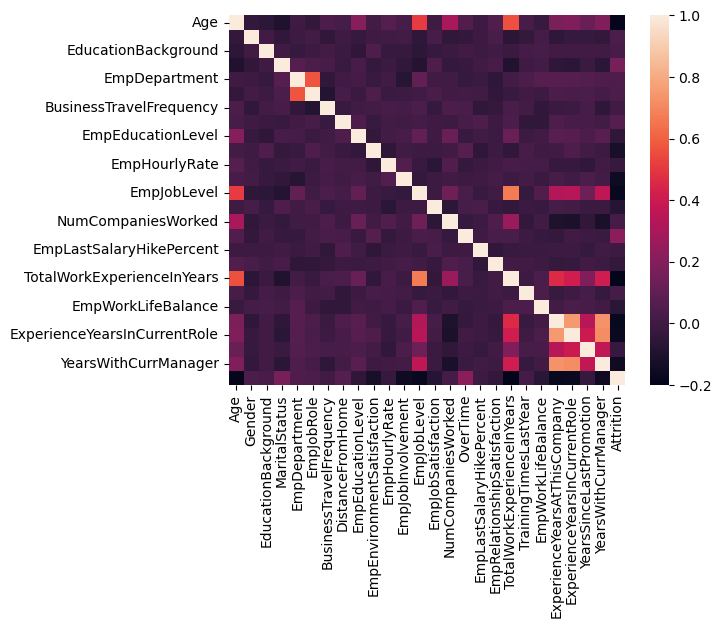

In [166]:
df.drop('PerformanceRating',axis=1)
sns.heatmap(df.drop('PerformanceRating',axis=1).corr())

#### No correlation found between two independent features i.e multiicolinerity

### Model Creation

In [167]:
x=df.drop('PerformanceRating',axis=1)
y=df.PerformanceRating
x.head()


,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,...,EmpLastSalaryHikePercent,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition
0,32,1.0,2.0,2.0,5.0,13.0,2.0,10,3,4,...,12,4,10,2,2,10,7,0,8,0.0
1,47,1.0,2.0,2.0,5.0,13.0,2.0,14,4,4,...,12,4,20,2,3,7,7,1,7,0.0
2,40,1.0,1.0,1.0,5.0,13.0,1.0,5,4,4,...,21,3,20,2,3,18,13,1,12,0.0
3,41,1.0,0.0,0.0,3.0,8.0,2.0,10,4,2,...,15,2,23,2,2,5,6,1,6,0.0
4,60,1.0,2.0,2.0,5.0,13.0,2.0,16,4,1,...,14,4,10,1,3,2,2,2,2,0.0


In [168]:
y

0       3
1       3
2       4
3       3
4       3
5       4
6       3
7       3
8       3
9       3
10      3
11      3
12      4
13      3
14      3
15      3
16      3
17      3
18      4
19      3
20      3
21      3
22      3
23      3
24      3
25      4
26      3
27      4
28      3
29      3
30      3
31      4
32      3
33      3
34      3
35      3
36      3
37      3
38      3
39      3
40      3
41      3
42      3
43      3
44      4
45      3
46      3
47      4
48      3
49      3
50      3
51      3
52      3
53      3
54      4
55      3
56      3
57      3
58      3
59      3
60      4
61      3
62      3
63      3
64      3
65      3
66      3
67      3
68      4
69      3
70      3
71      3
72      3
73      3
74      3
75      3
76      3
77      3
78      3
79      3
80      3
81      3
82      3
83      3
84      3
85      3
86      3
87      3
88      3
89      3
90      3
91      3
92      3
93      3
94      3
95      3
96      3
97      3
98      4
99      3


In [169]:
from sklearn.model_selection import train_test_split


### Checking balncing of Data

#### after the counting of classes we found the 3 is majority class which supress the  other two classes so we need to oversampling more specifically SMOTE

In [170]:
from imblearn.over_sampling import SMOTE
SM=SMOTE(random_state=42)

In [171]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=42)

In [172]:
from collections import Counter
print(Counter(y_test))
print(Counter(y_train))

Counter({3: 184, 2: 29, 4: 27})
Counter({3: 690, 2: 165, 4: 105})


In [173]:
x_resample,y_resample=SM.fit_resample(x_train,y_train)


In [174]:
x_resample.shape

(2070, 26)

In [175]:
y_resample.shape

(2070,)

In [176]:
x_test.shape

(240, 26)

In [177]:
y_test.shape

(240,)

#### Logistic Regression 

#### Without Hyper-Parameter Tunning

In [178]:
from sklearn.linear_model import LogisticRegression
lr=LogisticRegression()

In [179]:
lr.fit(x_resample,y_resample)

LogisticRegression()

In [180]:
y_pred=lr.predict(x_test)
y_pred

array([4, 2, 3, 3, 3, 3, 2, 3, 2, 4, 4, 4, 3, 2, 2, 4, 3, 2, 4, 2, 2, 3,
       3, 3, 4, 4, 3, 3, 3, 3, 3, 3, 3, 4, 2, 3, 2, 3, 3, 3, 2, 4, 4, 3,
       3, 3, 3, 2, 2, 2, 2, 2, 3, 3, 2, 3, 3, 3, 3, 2, 4, 3, 4, 3, 3, 3,
       2, 4, 3, 3, 2, 3, 3, 3, 3, 4, 3, 3, 3, 4, 3, 3, 3, 4, 4, 3, 2, 3,
       3, 2, 3, 4, 3, 3, 3, 2, 2, 3, 4, 3, 3, 2, 3, 3, 4, 4, 3, 3, 3, 2,
       3, 2, 4, 3, 4, 4, 3, 3, 3, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2,
       3, 3, 3, 3, 4, 3, 3, 4, 3, 4, 3, 3, 3, 3, 3, 3, 3, 3, 2, 3, 2, 2,
       3, 2, 3, 4, 2, 4, 3, 3, 2, 3, 2, 3, 3, 2, 3, 4, 3, 3, 3, 2, 4, 4,
       2, 3, 3, 3, 3, 3, 2, 3, 3, 2, 3, 2, 3, 3, 3, 2, 3, 4, 2, 3, 3, 3,
       4, 3, 4, 3, 2, 3, 3, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 3, 3, 3, 3,
       3, 3, 3, 3, 4, 4, 3, 4, 4, 2, 3, 4, 3, 4, 4, 2, 3, 3, 3, 3],
      dtype=int64)

In [181]:
y.values

array([3, 3, 4, ..., 3, 3, 2], dtype=int64)

In [182]:
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score,classification_report,confusion_matrix

In [183]:
lr_acc=accuracy_score(y_pred,y_test)
lr_acc

0.7375

In [184]:
pr=precision_score(y_pred,y_test,average='weighted')
pr

0.7365335850593221

In [185]:
re=recall_score(y_pred,y_test,average='weighted')
re

0.7375

In [186]:
f1=f1_score(y_pred,y_test,average='weighted')
f1

0.7176286635475503

In [187]:
print(classification_report(y_pred,y_test))

              precision    recall  f1-score   support

           2       0.76      0.46      0.57        48
           3       0.74      0.92      0.82       148
           4       0.70      0.43      0.54        44

    accuracy                           0.74       240
   macro avg       0.73      0.60      0.64       240
weighted avg       0.74      0.74      0.72       240



In [188]:
pd.crosstab(y_pred,y_test)

PerformanceRating,2,3,4
row_0,,,
2,22,26,0
3,4,136,8
4,3,22,19


#### With Hyper-Parametertunning

In [189]:
lr1=LogisticRegression()
from sklearn.model_selection import cross_val_score

In [190]:
cv=cross_val_score(lr1,x,y,scoring='f1',cv=5)
cv

array([nan, nan, nan, nan, nan])

In [191]:
from sklearn.model_selection import GridSearchCV


In [192]:
lr2=LogisticRegression()

In [193]:
param_grid={'C':[0.1,1,10,100,1000],'tol':[0.00001,0.0001,0.001,0.01,0.1],'max_iter':[100,200,300,400,500]}

In [194]:
grid=GridSearchCV(lr2,param_grid,scoring='f1',cv=5,verbose=3)

In [195]:
grid.fit(x_resample,y_resample)

Fitting 5 folds for each of 125 candidates, totalling 625 fits
[CV 1/5] END ......C=0.1, max_iter=100, tol=1e-05;, score=nan total time=   0.0s
[CV 2/5] END ......C=0.1, max_iter=100, tol=1e-05;, score=nan total time=   0.0s
[CV 3/5] END ......C=0.1, max_iter=100, tol=1e-05;, score=nan total time=   0.0s
[CV 4/5] END ......C=0.1, max_iter=100, tol=1e-05;, score=nan total time=   0.0s
[CV 5/5] END ......C=0.1, max_iter=100, tol=1e-05;, score=nan total time=   0.0s
[CV 1/5] END .....C=0.1, max_iter=100, tol=0.0001;, score=nan total time=   0.0s
[CV 2/5] END .....C=0.1, max_iter=100, tol=0.0001;, score=nan total time=   0.0s
[CV 3/5] END .....C=0.1, max_iter=100, tol=0.0001;, score=nan total time=   0.0s
[CV 4/5] END .....C=0.1, max_iter=100, tol=0.0001;, score=nan total time=   0.0s
[CV 5/5] END .....C=0.1, max_iter=100, tol=0.0001;, score=nan total time=   0.0s
[CV 1/5] END ......C=0.1, max_iter=100, tol=0.001;, score=nan total time=   0.0s
[CV 2/5] END ......C=0.1, max_iter=100, tol=0.

GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'max_iter': [100, 200, 300, 400, 500],
                         'tol': [1e-05, 0.0001, 0.001, 0.01, 0.1]},
             scoring='f1', verbose=3)

In [196]:
grid.best_params_

{'C': 0.1, 'max_iter': 100, 'tol': 1e-05}

In [197]:
grid.best_estimator_

LogisticRegression(C=0.1, tol=1e-05)

In [198]:
lr3=LogisticRegression(C=0.1, tol=1e-05)

In [199]:
lr3.fit(x_resample,y_resample)

LogisticRegression(C=0.1, tol=1e-05)

In [200]:
y_pred_hy=lr3.predict(x_test)
y_pred_hy

array([4, 2, 3, 3, 3, 3, 2, 3, 2, 4, 4, 4, 3, 2, 2, 4, 3, 2, 4, 2, 2, 3,
       3, 3, 4, 4, 3, 3, 3, 3, 3, 3, 3, 4, 2, 3, 2, 3, 3, 3, 2, 4, 4, 3,
       3, 3, 3, 2, 2, 2, 2, 2, 2, 3, 2, 3, 3, 3, 3, 2, 4, 3, 4, 3, 3, 3,
       2, 4, 3, 3, 2, 3, 3, 4, 3, 4, 3, 3, 3, 4, 3, 3, 3, 4, 4, 3, 2, 3,
       3, 2, 3, 4, 3, 3, 3, 2, 2, 3, 4, 3, 3, 2, 3, 3, 4, 4, 3, 3, 3, 2,
       3, 2, 3, 3, 4, 4, 3, 3, 3, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2,
       3, 3, 3, 3, 4, 3, 3, 4, 3, 4, 3, 3, 3, 3, 3, 3, 3, 3, 2, 3, 2, 2,
       3, 2, 3, 4, 2, 4, 3, 3, 2, 3, 2, 3, 3, 2, 3, 4, 4, 3, 3, 2, 4, 4,
       2, 3, 3, 3, 3, 3, 2, 3, 3, 2, 3, 2, 3, 3, 3, 2, 3, 4, 2, 3, 3, 3,
       4, 3, 4, 3, 2, 3, 3, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 3, 3, 3, 3,
       3, 3, 3, 3, 4, 4, 3, 4, 3, 2, 3, 4, 3, 4, 4, 2, 3, 3, 3, 3],
      dtype=int64)

In [201]:
lr_acc_hy=accuracy_score(y_pred_hy,y_test)
lr_acc_hy

0.7416666666666667

In [202]:
pr_hy=precision_score(y_pred_hy,y_test,average='weighted')
pr_hy

0.7434049179114146

In [203]:
re_hy=recall_score(y_pred_hy,y_test,average='weighted')
re_hy

0.7416666666666667

In [204]:
f1_hy=f1_score(y_pred_hy,y_test,average='weighted')
f1_hy

0.7217805879873452

### Support Vector Machine

In [205]:
from sklearn.svm import SVC
svc=SVC()

In [206]:
svc.fit(x_resample,y_resample)

SVC()

In [207]:
y_pred_sv=svc.predict(x_test)

In [208]:
from sklearn.metrics import precision_score,recall_score,roc_auc_score,f1_score,confusion_matrix

In [209]:
svc_pr=precision_score(y_pred_sv,y_test, average='weighted')
svc_pr

0.591203009606308

In [210]:
recall_score(y_pred_sv,y_test,average='weighted')

0.575

In [211]:
accuracy_score(y_pred_sv,y_test)

0.575

In [212]:
f1_score(y_pred_sv,y_test,average='weighted')

0.5270035687608151

In [213]:
pd.crosstab(y_pred_sv,y_test)

PerformanceRating,2,3,4
row_0,,,
2,13,48,2
3,5,104,4
4,11,32,21


In [214]:
print(classification_report(y_pred_sv,y_test))

              precision    recall  f1-score   support

           2       0.45      0.21      0.28        63
           3       0.57      0.92      0.70       113
           4       0.78      0.33      0.46        64

    accuracy                           0.57       240
   macro avg       0.60      0.48      0.48       240
weighted avg       0.59      0.57      0.53       240



### with Hyper-Pramameter Tunning

In [215]:
from sklearn.model_selection import cross_val_score 

In [216]:
cv=cross_val_score(svc,x,y,scoring='f1',cv=5)
cv

array([nan, nan, nan, nan, nan])

In [217]:
from sklearn.model_selection import GridSearchCV


In [218]:
svc1=SVC()

In [219]:
param_grid ={'C':[0.1,1,10,100,1000]}

In [220]:
grid_svc=GridSearchCV(svc1,param_grid,scoring='f1',cv=5,verbose=3)

In [221]:
grid_svc.fit(x_resample,y_resample)

Fitting 5 folds for each of 5 candidates, totalling 25 fits
[CV 1/5] END ...............................C=0.1;, score=nan total time=   0.5s
[CV 2/5] END ...............................C=0.1;, score=nan total time=   0.5s
[CV 3/5] END ...............................C=0.1;, score=nan total time=   0.5s
[CV 4/5] END ...............................C=0.1;, score=nan total time=   0.6s
[CV 5/5] END ...............................C=0.1;, score=nan total time=   0.5s
[CV 1/5] END .................................C=1;, score=nan total time=   0.4s
[CV 2/5] END .................................C=1;, score=nan total time=   0.4s
[CV 3/5] END .................................C=1;, score=nan total time=   0.4s
[CV 4/5] END .................................C=1;, score=nan total time=   0.4s
[CV 5/5] END .................................C=1;, score=nan total time=   0.4s
[CV 1/5] END ................................C=10;, score=nan total time=   0.2s
[CV 2/5] END ................................C=10

GridSearchCV(cv=5, estimator=SVC(), param_grid={'C': [0.1, 1, 10, 100, 1000]},
             scoring='f1', verbose=3)

In [222]:
grid_svc.best_params_

{'C': 0.1}

In [223]:
y_pred_svc=svc.predict(x_test)

In [224]:
grid_svc.estimator

SVC()

In [225]:
sv2=SVC()

In [226]:
sv2.fit(x_resample,y_resample)

SVC()

In [227]:
sv2.predict(x_test)

array([4, 2, 3, 3, 3, 3, 2, 3, 3, 4, 3, 4, 3, 2, 2, 4, 3, 2, 4, 4, 2, 4,
       4, 3, 4, 4, 3, 3, 3, 4, 3, 4, 3, 4, 4, 2, 4, 3, 2, 3, 2, 4, 4, 3,
       3, 2, 3, 2, 2, 2, 2, 4, 2, 2, 2, 4, 2, 3, 2, 2, 4, 3, 4, 4, 2, 2,
       2, 4, 2, 3, 2, 3, 4, 4, 3, 4, 2, 3, 3, 3, 3, 3, 2, 4, 4, 2, 2, 3,
       3, 4, 3, 4, 3, 3, 3, 2, 2, 3, 3, 2, 3, 2, 2, 3, 4, 4, 3, 4, 3, 4,
       3, 2, 4, 3, 4, 4, 3, 3, 2, 2, 3, 3, 3, 3, 3, 2, 3, 3, 2, 2, 3, 2,
       3, 3, 3, 2, 4, 3, 3, 4, 3, 4, 2, 4, 3, 3, 2, 3, 3, 2, 2, 2, 2, 4,
       3, 3, 2, 4, 3, 4, 3, 3, 2, 3, 3, 4, 3, 4, 3, 4, 4, 2, 3, 2, 3, 2,
       2, 4, 3, 3, 4, 3, 4, 3, 3, 2, 3, 3, 3, 3, 3, 2, 3, 4, 2, 2, 3, 3,
       4, 4, 4, 3, 2, 3, 3, 3, 3, 3, 3, 4, 3, 3, 3, 3, 3, 2, 3, 3, 3, 3,
       3, 3, 3, 3, 4, 4, 2, 4, 3, 2, 3, 4, 3, 4, 4, 4, 3, 3, 4, 2],
      dtype=int64)

In [228]:
from sklearn.metrics import accuracy_score,f1_score,precision_score,recall_score,confusion_matrix,classification_report

In [229]:
accuracy_score(y_pred_svc,y_test)

0.575

In [230]:
f1_score(y_pred_svc,y_test,average='weighted')

0.5270035687608151

In [231]:
precision_score(y_pred_svc,y_test,average='weighted')

0.591203009606308

In [232]:
recall_score(y_pred_svc,y_test,average='weighted')

0.575

In [233]:
confusion_matrix(y_pred_svc,y_test)

array([[ 13,  48,   2],
       [  5, 104,   4],
       [ 11,  32,  21]], dtype=int64)

In [234]:
print(classification_report(y_pred_svc,y_test))

              precision    recall  f1-score   support

           2       0.45      0.21      0.28        63
           3       0.57      0.92      0.70       113
           4       0.78      0.33      0.46        64

    accuracy                           0.57       240
   macro avg       0.60      0.48      0.48       240
weighted avg       0.59      0.57      0.53       240



### Decision Tree

In [235]:
from sklearn.tree import DecisionTreeClassifier
dt=DecisionTreeClassifier()

In [236]:
dt.fit(x_resample,y_resample)

DecisionTreeClassifier()

In [237]:
y_pred_dt=dt.predict(x_test)
y_pred_dt

array([4, 2, 3, 3, 3, 3, 3, 3, 2, 3, 3, 4, 3, 3, 2, 4, 3, 3, 4, 2, 2, 3,
       3, 3, 3, 4, 3, 3, 3, 3, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 3, 4, 4,
       3, 3, 3, 3, 3, 2, 2, 4, 3, 3, 3, 3, 3, 3, 3, 2, 3, 3, 3, 3, 3, 3,
       3, 4, 3, 2, 2, 3, 4, 4, 3, 2, 3, 3, 2, 4, 3, 3, 3, 3, 4, 3, 3, 3,
       3, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 2, 3, 3, 2,
       3, 2, 3, 3, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 3,
       3, 3, 3, 3, 4, 3, 3, 2, 3, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2,
       3, 3, 3, 4, 3, 4, 3, 3, 3, 3, 3, 4, 3, 2, 3, 4, 3, 3, 3, 3, 3, 4,
       3, 2, 3, 3, 3, 3, 2, 3, 3, 2, 3, 3, 3, 3, 3, 3, 3, 4, 2, 3, 4, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 4, 4, 3, 4, 3, 3, 3, 3, 4, 3, 4, 3, 3, 2, 3, 3],
      dtype=int64)

### Evaultion metrics for Testing

In [238]:
accuracy_score(y_pred_dt,y_test)

0.8666666666666667

In [239]:
f1_score(y_pred_dt,y_test,average='weighted')

0.8659459057650608

In [240]:
precision_score(y_pred_dt,y_test,average='weighted')

0.8673522324485905

In [241]:
recall_score(y_pred_dt,y_test,average='weighted')

0.8666666666666667

In [242]:
confusion_matrix(y_pred_dt,y_test)

array([[ 19,   6,   0],
       [  7, 169,   7],
       [  3,   9,  20]], dtype=int64)

In [243]:
print(classification_report(y_pred_dt,y_test))

              precision    recall  f1-score   support

           2       0.66      0.76      0.70        25
           3       0.92      0.92      0.92       183
           4       0.74      0.62      0.68        32

    accuracy                           0.87       240
   macro avg       0.77      0.77      0.77       240
weighted avg       0.87      0.87      0.87       240



### Evualtion metrics for training 

In [244]:
y_pred_dt_tr=dt.predict(x_train)
y_pred_dt_tr

array([2, 3, 3, 3, 3, 3, 2, 3, 3, 3, 2, 3, 2, 3, 4, 3, 3, 2, 4, 3, 3, 3,
       4, 3, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 4, 3, 3, 3, 3, 3, 3, 3, 3, 2, 3, 3, 2, 3, 3, 4, 2, 4, 3, 3,
       3, 3, 3, 3, 2, 4, 2, 3, 3, 3, 2, 3, 3, 4, 3, 3, 4, 2, 3, 2, 2, 3,
       3, 3, 2, 4, 3, 3, 4, 3, 2, 4, 3, 4, 3, 3, 3, 3, 2, 3, 3, 3, 3, 2,
       3, 2, 4, 3, 4, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2,
       3, 3, 2, 3, 3, 2, 3, 3, 3, 2, 2, 3, 3, 2, 4, 3, 3, 3, 2, 3, 3, 3,
       2, 3, 4, 3, 3, 3, 3, 2, 2, 2, 3, 3, 2, 3, 3, 3, 3, 2, 4, 3, 2, 3,
       3, 3, 3, 2, 3, 3, 2, 3, 3, 3, 4, 3, 3, 3, 3, 2, 2, 2, 2, 3, 3, 4,
       3, 3, 2, 3, 3, 3, 3, 3, 4, 3, 2, 3, 3, 4, 3, 3, 3, 4, 4, 3, 2, 4,
       4, 2, 4, 3, 2, 2, 2, 4, 3, 3, 3, 3, 3, 2, 2, 2, 3, 3, 4, 3, 4, 2,
       3, 3, 3, 2, 4, 4, 3, 3, 3, 3, 3, 3, 3, 2, 2, 2, 3, 3, 3, 3, 3, 4,
       2, 3, 3, 4, 3, 4, 3, 2, 3, 4, 3, 3, 3, 3, 2, 3, 3, 3, 3, 2, 3, 3,
       3, 3, 3, 2, 3, 3, 3, 2, 3, 3, 3, 3, 4, 2, 3,

In [245]:
accuracy_score(y_pred_dt_tr,y_train)

1.0

In [246]:
precision_score(y_pred_dt_tr,y_train,average='weighted')

1.0

In [247]:
recall_score(y_pred_dt_tr,y_train,average='weighted')

1.0

In [248]:
f1_score(y_pred_dt_tr,y_train,average='weighted')

1.0

In [249]:
print(classification_report(y_pred_dt_tr,y_train))

              precision    recall  f1-score   support

           2       1.00      1.00      1.00       165
           3       1.00      1.00      1.00       690
           4       1.00      1.00      1.00       105

    accuracy                           1.00       960
   macro avg       1.00      1.00      1.00       960
weighted avg       1.00      1.00      1.00       960



In [250]:
confusion_matrix(y_pred_dt_tr,y_train)

array([[165,   0,   0],
       [  0, 690,   0],
       [  0,   0, 105]], dtype=int64)

### with Hyper-Parameter Tunning

In [257]:
from sklearn.model_selection import cross_val_score
cv=cross_val_score(dt,x_resample,y_resample,scoring='f1',cv=5)

In [258]:
from sklearn.model_selection import GridSearchCV
dt1=DecisionTreeClassifier()

In [259]:
list(range(1, 20))

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]

In [278]:
params = {
    'criterion': ['gini', 'entropy'], 
    "max_depth":(list(range(1, 20))),
    'min_samples_split': [2, 5, 10],
}


In [279]:
grid_dt=GridSearchCV(dt1,params,scoring='f1',cv=5,verbose=3)

In [280]:
grid_dt.fit(x_resample, y_resample)

Fitting 5 folds for each of 114 candidates, totalling 570 fits
[CV 1/5] END criterion=gini, max_depth=1, min_samples_split=2;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=1, min_samples_split=2;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=1, min_samples_split=2;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=1, min_samples_split=2;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=1, min_samples_split=2;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=1, min_samples_split=5;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=1, min_samples_split=5;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=1, min_samples_split=5;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=1, min_samples_split=5;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=1, min_samples_split=5;, score=nan total time=   0.0s
[CV 1/5

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                       13, 14, 15, 16, 17, 18, 19],
                         'min_samples_split': [2, 5, 10]},
             scoring='f1', verbose=3)

In [281]:
grid_dt.best_params_

{'criterion': 'gini', 'max_depth': 1, 'min_samples_split': 2}

In [282]:
grid_dt.best_estimator_

DecisionTreeClassifier(max_depth=1)

In [283]:
dt3=DecisionTreeClassifier(max_depth=1)

In [284]:
dt3.fit(x_resample,y_resample)

DecisionTreeClassifier(max_depth=1)

### Testing

In [285]:
y_pred_dt_hy=dt3.predict(x_test)

In [286]:
accuracy_score(y_pred_dt_hy,y_test)

0.8208333333333333

In [287]:
precision_score(y_pred_dt_hy,y_test,average='weighted')

0.9282206119162643

In [288]:
recall_score(y_pred_dt_hy,y_test,average='weighted')

0.8208333333333333

In [289]:
f1_score(y_pred_dt_hy,y_test,average='weighted')

0.8698379168327354

In [290]:
confusion_matrix(y_pred_dt_hy,y_test)

array([[  0,   0,   0],
       [ 20, 176,   6],
       [  9,   8,  21]], dtype=int64)

In [291]:
print(classification_report(y_pred_dt_hy,y_test))

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         0
           3       0.96      0.87      0.91       202
           4       0.78      0.55      0.65        38

    accuracy                           0.82       240
   macro avg       0.58      0.47      0.52       240
weighted avg       0.93      0.82      0.87       240



### Traning 

In [292]:
y_pred_dt_hy_tr=dt3.predict(x_resample)
y_pred_dt_hy_tr

array([3, 3, 3, ..., 4, 4, 4], dtype=int64)

In [293]:
accuracy_score(y_pred_dt_hy_tr,y_resample)

0.576328502415459

In [295]:
precision_score(y_pred_dt_hy_tr,y_resample,average='weighted')

0.8983238815374922

In [297]:
recall_score(y_pred_dt_hy_tr,y_resample,average='weighted')

0.576328502415459

In [299]:
f1_score(y_pred_dt_hy_tr,y_resample,average='weighted')

0.6750422976735563

In [300]:
confusion_matrix(y_pred_dt_hy_tr,y_resample)

array([[  0,   0,   0],
       [641, 655, 152],
       [ 49,  35, 538]], dtype=int64)

In [301]:
print(classification_report(y_pred_dt_hy_tr,y_resample))

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         0
           3       0.95      0.45      0.61      1448
           4       0.78      0.86      0.82       622

    accuracy                           0.58      2070
   macro avg       0.58      0.44      0.48      2070
weighted avg       0.90      0.58      0.68      2070



In [302]:
'''after applying hyper-parameter tunning problem become underfitting so now either go with without hyperparameter tunning or used ensamble techniques'''

'after applying hyper-parameter tunning problem become underfitting so now either go with without hyperparameter tunning or used ensamble techniques'